Solving First-order Differential Equations with the Runge-Kutta Method

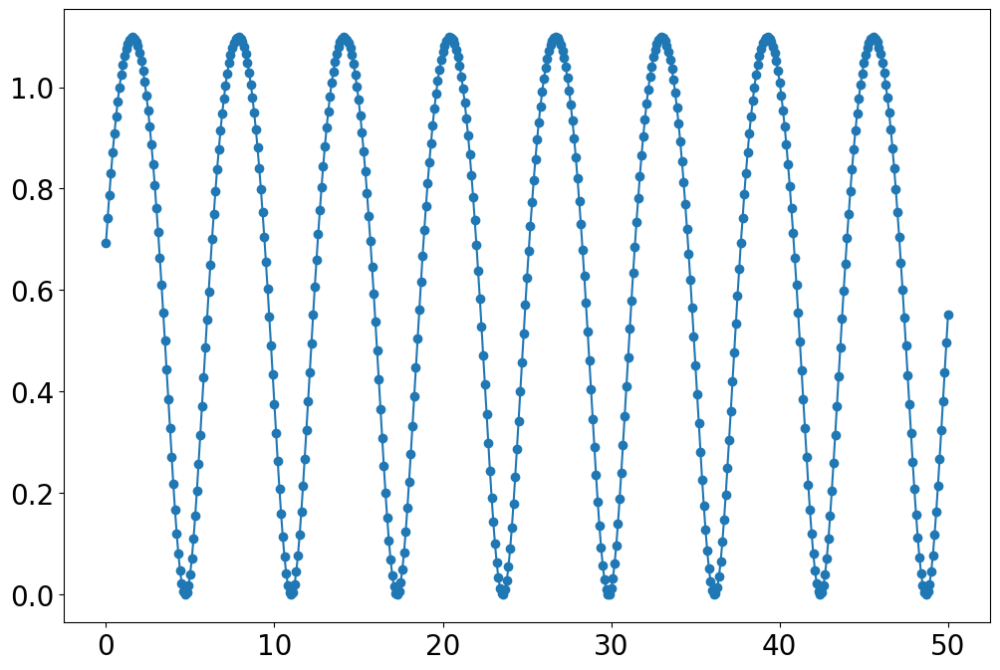

In [9]:
import numpy as np
import matplotlib.pyplot as plt

def f1(x, t):
    f = np.exp(-x) * np.cos(t)
    return f

x0 = np.log(2) # Initial value
t0 = 0.0 # Initial time

# Time and interval
T = 50
n = 500
dt = T / n

x = np.zeros(n+1)
t = np.zeros(n+1)
x[0] = x0
t[0] = t0

# Runge-Kutta
for i in range(n):
    k_1 = dt * f1(x[i], t[i])
    k_2 = dt * f1(x[i] + k_1 / 2, t[i] + dt / 2)
    k_3 = dt * f1(x[i] + k_2 / 2, t[i] + dt / 2)
    k_4 = dt * f1(x[i] + k_3, t[i] + dt)
    x[i+1] = x[i] + 1/6 * (k_1 + 2*k_2 + 2*k_3 + k_4)
    t[i+1] = t[i] + dt

# Analytical solution
xa = np.zeros((501))
ta = np.zeros((501))
dta = 0.1
xa[0] = x0
ta[0] = t0

for i in range(0, 500):
    xa[i+1] = np.log(2 + np.sin(ta[i]))
    ta[i+1] = ta[i] + dta

# Create figure window
fig = plt.figure(figsize=(12, 8), facecolor='w')
plt.rcParams['font.size'] = 20
plt.rcParams['font.family'] = 'DejaVu Sans'
plt.plot(t[:], x[:], lw=1.5, marker="o", label='numerical')
plt.plot(ta[:], xa[:], lw=1.5, color="red", label='analytical')
plt.legend(bbox_to_anchor=(1, 1), loc='upper right', borderaxespad=1, fontsize=18)
plt.xlabel("t")
plt.ylabel("x")
plt.show()

Solving Thermal Equibrium Equation with RK

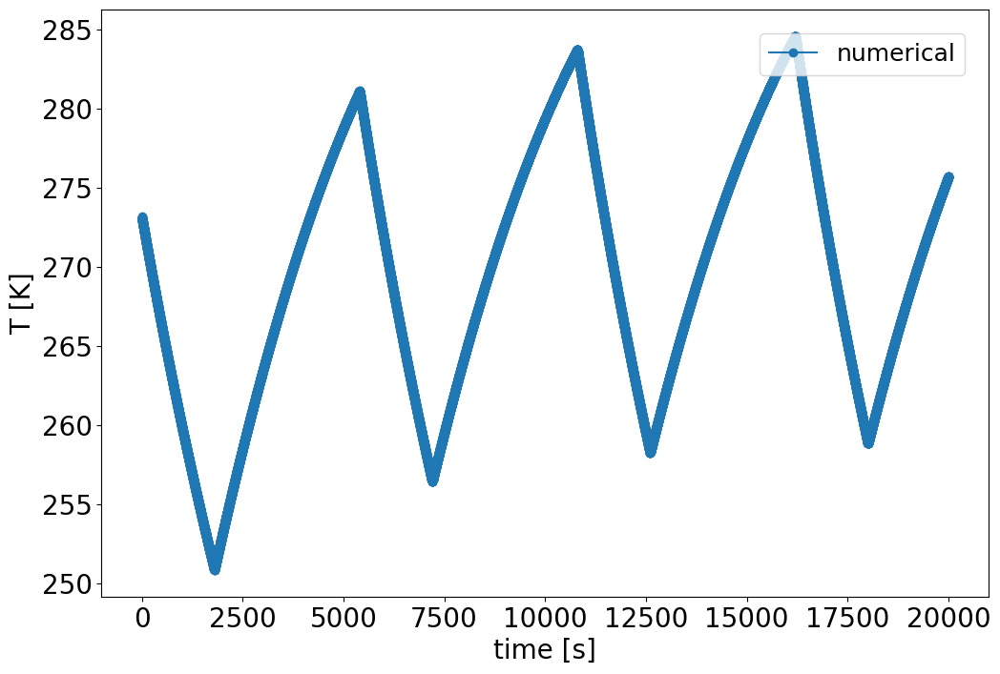

In [9]:
import numpy as np
import matplotlib.pyplot as plt

def f1(x, t, s_f):
    # If s_f = 0: No solar radiation, albedo, or Earth IR (simplified)
    if s_f == 0:
        Qt = 0
    elif s_f == 1:
        Qt = 20
    epsi = 0.88
    sig = 5.669 * 10**(-8)
    A = 0.06   # m^2
    Fu = 0.8
    m = 1.0    # kg
    c = 905    # J/kg·K
    f = (Qt - epsi * sig * A * Fu * x**4) / (m * c)
    return f

x0 = 273.15   # Initial value
t0 = 0.0      # Initial time

# Time and interval
T = 20000
n = 20000
dt = T / n

# Sun flag
s_f = np.zeros(n+1)
s_t = 0
sunny_time = 60 * 60
shade_time = 30 * 60

x = np.zeros(n+1)
t = np.zeros(n+1)
x[0] = x0
t[0] = t0

# Runge-Kutta
for i in range(n):

    # sun-shade flag
    if s_t > shade_time:
        s_f = 1
        if s_t > sunny_time + shade_time:
            s_f = 0
            s_t = 0
    else:
        s_f = 0
    s_t = s_t + 1

    # Runge-Kutta
    k_1 = dt * f1(x[i], t[i], s_f)
    k_2 = dt * f1(x[i] + k_1 / 2, t[i] + dt / 2, s_f)
    k_3 = dt * f1(x[i] + k_2 / 2, t[i] + dt / 2, s_f)
    k_4 = dt * f1(x[i] + k_3, t[i] + dt, s_f)
    x[i+1] = x[i] + 1/6 * (k_1 + 2*k_2 + 2*k_3 + k_4)
    t[i+1] = t[i] + dt

# Create figure window
fig = plt.figure(figsize=(12, 8), facecolor='w')
plt.rcParams['font.size'] = 20
plt.rcParams['font.family'] = 'DejaVu Sans'
plt.plot(t[:], x[:], lw=1.5, marker="o", label='numerical')
plt.legend(bbox_to_anchor=(1, 1), loc='upper right', borderaxespad=1, fontsize=18)
plt.xlabel("time [s]")
plt.ylabel("T [K]")
plt.show()

Solving Multi-nodal(Inner and Outer) Thermal Equibrium Equation with RK

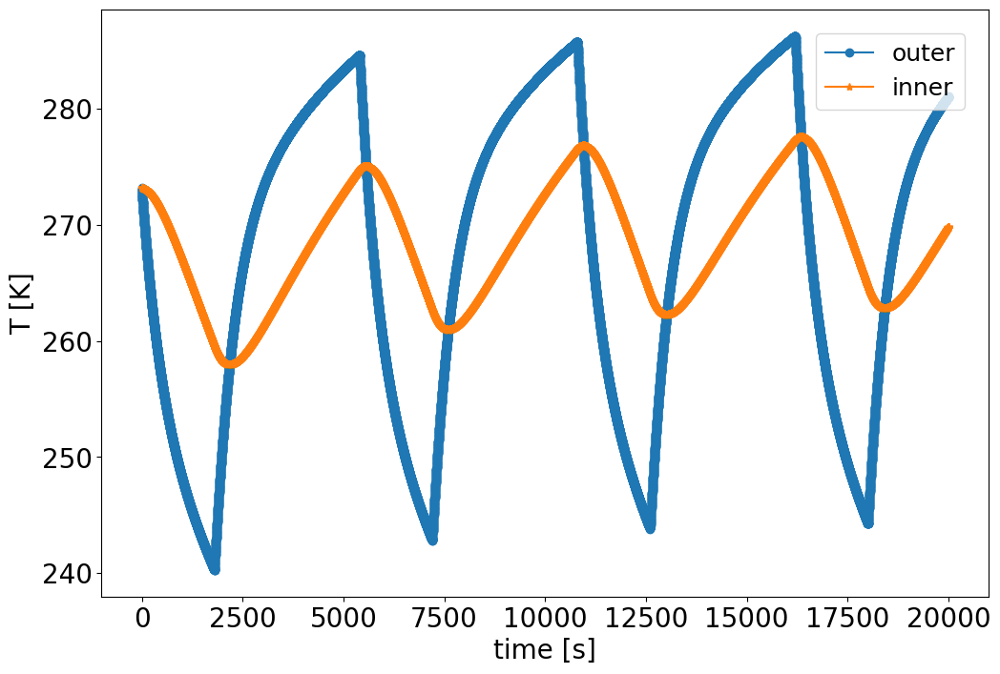

In [12]:
import numpy as np
import matplotlib.pyplot as plt

def f1(x, t, s_f):
    epsi = 0.888
    sig = 5.669 * 10**(-8)
    A = 0.06   # m^2
    Fu = 0.8
    m = [0.3, 0.7] # kg
    c = 905   # J/kg·K
    alp = 0.659
    Es = 1353 # W/m^2 Solar energy
    Ea = 0.3 * Es # W/m^2 Albedo energy
    Ee = 237  # W/m^2 Earth infrared energy
    Fs = 0.25 # Solar view factor or coefficient represented by beta angle (1/4 of the surface area, fairly reasonable)
    Fa = 0.25 # Earth (Albedo) view factor
    Fe = 0.25 # Earth (Infrared) view factor
    Qi = 0.0  # W Internal heat generation
    epsi_o = 0.15

    K = np.array([[-0.3, 0.3], [0.3, -0.3]]) # Thermal conductivity coefficient (J/K)
    R = np.array([[-sig * epsi_o * A * 0.15, sig * epsi_o * A * 0.15],
                  [sig * epsi_o * A * 0.15, -sig * epsi_o * A * 0.15]]) # (W/K^4)
    Kt = K @ x
    Rt = R @ (x**4)

    if s_f == 0:
        f = np.array([(- epsi * sig * A * Fu * x[0]**4 + Kt[0] + Rt[0]) / (m[0] * c),
                      (Kt[1] + Rt[1]) / (m[1] * c)])
    elif s_f == 1:
        f = np.array([(Qi + alp * Es * Fs * A + alp * Ea * Fa * A + alp * Ee * Fe * A
                      - epsi * sig * A * Fu * x[0]**4 + Kt[0] + Rt[0]) / (m[0] * c),
                      (Qi + Kt[1] + Rt[1]) / (m[1] * c)])
    return f

x0 = [273.15, 273.15] # Initial value
t0 = 0.0              # Initial time

# Time and interval
T = 20000
n = 20000
dt = T / n

# Sun flag
s_f = np.zeros(n+1)
s_t = 0
sunny_time = 60 * 60
shade_time = 30 * 60

x = np.zeros((n+1, 2))
t = np.zeros(n+1)
x[0] = x0
t[0] = t0

# Runge-Kutta
for i in range(n):
    # sun-shade flag
    if s_t > shade_time:
        s_f = 1
        if s_t > sunny_time + shade_time:
            s_f = 0
            s_t = 0
    else:
        s_f = 0
    s_t = s_t + 1

    # Runge-Kutta
    k_1 = dt * f1(x[i], t[i], s_f)
    k_2 = dt * f1(x[i] + k_1 / 2, t[i] + dt / 2, s_f)
    k_3 = dt * f1(x[i] + k_2 / 2, t[i] + dt / 2, s_f)
    k_4 = dt * f1(x[i] + k_3, t[i] + dt, s_f)
    x[i+1] = x[i] + 1/6 * (k_1 + 2*k_2 + 2*k_3 + k_4)
    t[i+1] = t[i] + dt

# Create figure window
fig = plt.figure(figsize=(12, 8), facecolor='w')
plt.rcParams['font.size'] = 20
plt.rcParams['font.family'] = 'DejaVu Sans'
plt.plot(t[:], x[:,0], lw=1.5, marker="o", label='outer')
plt.plot(t[:], x[:,1], lw=1.5, marker="*", label='inner')
plt.legend(bbox_to_anchor=(1, 1), loc='upper right', borderaxespad=1, fontsize=18)
plt.xlabel("time [s]")
plt.ylabel("T [K]")
plt.show()


Solving Equation of Motion of Two body problem

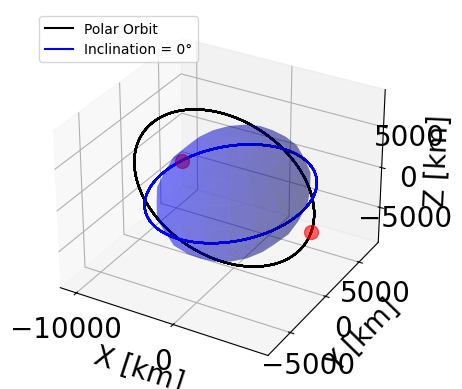

In [20]:
import numpy as np
from scipy.integrate import odeint
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import matplotlib.animation as animation

# Two-body problem motion equations
def func(x, t):
    GM = 398600.4354360959 # Earth's gravitational constant, km^3/s^2
    r = np.linalg.norm(x[0:3])
    dxdt = [x[3],
            x[4],
            x[5],
            -GM*x[0]/(r**3),
            -GM*x[1]/(r**3),
            -GM*x[2]/(r**3)]
    return dxdt

# Initial conditions for differential equations (Polar Orbit and 0° inclination)
x0 = [8000, 0, 0, 0, 0, 7.5] # Position (x,y,z)[km] + velocity (vx,vy,vz)[km/s]
x1 = [6771, 0, 0, 0, 7.8, 0] # Position (x,y,z)[km] + velocity (vx,vy,vz)[km/s]
t = np.linspace(0, 86400, 1000) # 1 day orbit propagation

# Numerical calculation of differential equations
sol0 = odeint(func, x0, t)
sol1 = odeint(func, x1, t)

ims = []
# Create figure window
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')

# Draw Earth as a blue sphere
earth_radius = 6371 # Earth radius [km]
u, v = np.mgrid[0:2*np.pi:20j, 0:np.pi:10j]
x = earth_radius * np.cos(u) * np.sin(v)
y = earth_radius * np.sin(u) * np.sin(v)
z = earth_radius * np.cos(v)
ax.plot_surface(x, y, z, color='blue', alpha=0.3)

# Plot the orbits
ax.plot(sol0[:, 0], sol0[:, 1], sol0[:, 2], 'k-', lw=1.5, label='Polar Orbit')
ax.plot(sol1[:, 0], sol1[:, 1], sol1[:, 2], 'b-', lw=1.5, label='Inclination = 0°')
ax.set_xlabel('X [km]')
ax.set_ylabel('Y [km]')
ax.set_zlabel('Z [km]')
lg = plt.legend(loc='upper left', fontsize=10)

# Create animation frames
for i in range(0, 99, 2):
    im1 = ax.plot(sol0[i, 0], sol0[i, 1], sol0[i, 2], 'o', color="r", markersize=10, lw=1.5, alpha=0.6)
    im2 = ax.plot(sol1[i, 0], sol1[i, 1], sol1[i, 2], 'o', color="r", markersize=10, lw=1.5, alpha=0.6)
    ims.append([im1[0], im2[0]])

# Create and save the animation
ani = animation.ArtistAnimation(fig, ims, interval=100)
ani.save('orbit2.gif', writer='pillow')

plt.show()

from IPython.display import HTML
HTML(ani.to_jshtml())

SGP4 Algorithm

Orbital period: 101.23 minutes


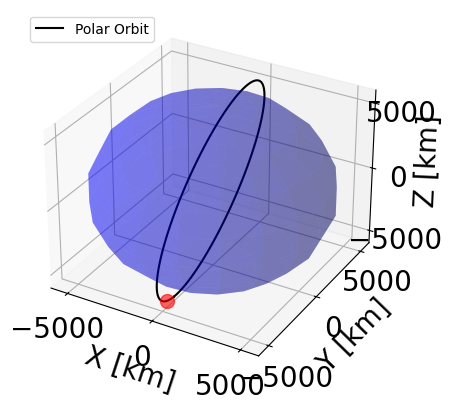

In [19]:
!pip install skyfield
from skyfield.api import load, EarthSatellite
import numpy as np

# TLE data
line1 = '1 27848U 03031J   23324.56756262  .00000301  00000+0  15467-3 0  9998'
line2 = '2 27848  98.6827 329.9178 0010535  52.3359 307.8773 14.22449757 57733'

# Create satellite object
satellite = EarthSatellite(line1, line2)

# Load timescale
ts = load.timescale()

# Calculate orbital period (in minutes)
orbital_period = 2 * np.pi / satellite.model.no_kozai
print(f"Orbital period: {orbital_period:.2f} minutes")

# Determine the time interval for calculations (e.g., every 10 minutes)
times = ts.utc(2023, 4, 1, 0, range(0, int(orbital_period) + 1, 1))

# Calculate satellite position and velocity
positions = satellite.at(times)
xyz_positions[0,:]

# Position vector and velocity vector in ECI coordinates
xyz_positions = positions.position.km   # Position (x, y, z) in kilometers
xyz_velocities = positions.velocity.km_per_s  # Velocity in kilometers per second

# Plot the orbits
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import matplotlib.animation as animation

ims = []
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')

# Draw Earth as a blue sphere
earth_radius = 6371  # Earth radius [km]
u, v = np.mgrid[0:2*np.pi:20j, 0:np.pi:10j]
x = earth_radius * np.cos(u) * np.sin(v)
y = earth_radius * np.sin(u) * np.sin(v)
z = earth_radius * np.cos(v)
ax.plot_surface(x, y, z, color='blue', alpha=0.3)

im0 = ax.plot(xyz_positions[0, :], xyz_positions[1, :], xyz_positions[2, :], 'k-', lw=1.5, label='Polar Orbit')
ax.set_xlabel('X [km]')
ax.set_ylabel('Y [km]')
ax.set_zlabel('Z [km]')
ax.set_xlim(-6000, 6000)
ax.set_ylim(-6000, 6000)
ax.set_zlim(-6000, 6000)
lg = plt.legend(loc='upper left', fontsize=10)

# Create animation frames
for i in range(0, 99, 2):
    im1 = ax.plot(xyz_positions[0, i], xyz_positions[1, i], xyz_positions[2, i],
                  'o', color="r", markersize=10, lw=1.5, alpha=0.6)
    ims.append([im1[0]])

# Create and save the animation
ani = animation.ArtistAnimation(fig, ims, interval=100)
ani.save('orbit3.gif', writer='pillow')

plt.show()

from IPython.display import HTML
HTML(ani.to_jshtml())

Lattitude and Longitude calculation by SGP4 Algorithm

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 11.8/11.8 MB 51.3 MB/s eta 0:00:00
Orbital period: 101.23 minutes


/usr/local/lib/python3.12/dist-packages/cartopy/io/__init__.py:242: DownloadWarning: Downloading: https://naturalearth.s3.amazonaws.com/110m_physical/ne_110m_coastline.zip
  warnings.warn(f'Downloading: {url}', DownloadWarning)
/usr/local/lib/python3.12/dist-packages/cartopy/io/__init__.py:242: DownloadWarning: Downloading: https://naturalearth.s3.amazonaws.com/110m_cultural/ne_110m_admin_0_boundary_lines_land.zip
  warnings.warn(f'Downloading: {url}', DownloadWarning)


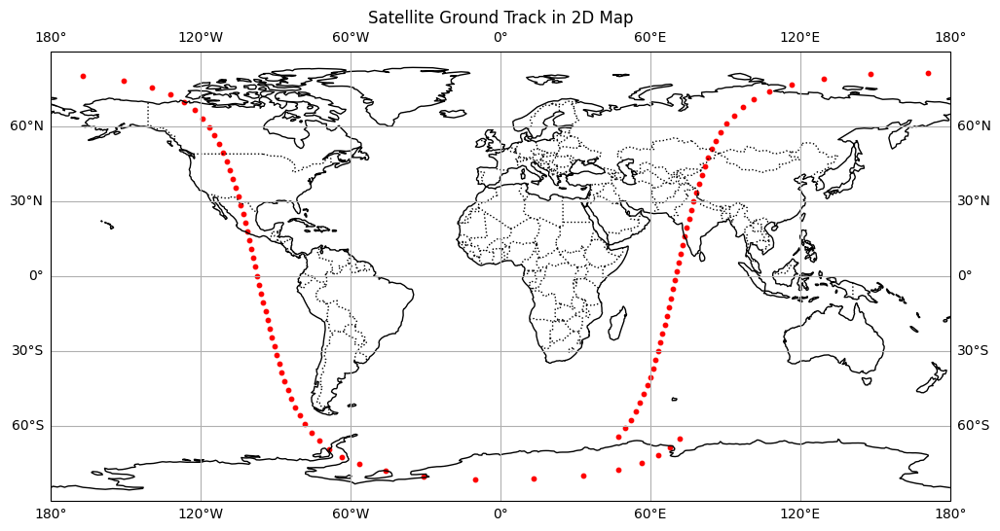

Time: 2023-04-01T00:00:00Z, Lat: -65.2250°, Lon: 71.5785°, Alt: 846.38 km
Time: 2023-04-01T00:01:00Z, Lat: -68.4836°, Lon: 67.8814°, Alt: 846.89 km
Time: 2023-04-01T00:02:00Z, Lat: -71.6466°, Lon: 63.0436°, Alt: 847.27 km
Time: 2023-04-01T00:03:00Z, Lat: -74.6558°, Lon: 56.4305°, Alt: 847.48 km
Time: 2023-04-01T00:04:00Z, Lat: -77.4016°, Lon: 46.9758°, Alt: 847.54 km
Time: 2023-04-01T00:05:00Z, Lat: -79.6728°, Lon: 33.0701°, Alt: 847.43 km
Time: 2023-04-01T00:06:00Z, Lat: -81.0988°, Lon: 13.3821°, Alt: 847.15 km
Time: 2023-04-01T00:07:00Z, Lat: -81.2559°, Lon: -9.9757°, Alt: 846.71 km
Time: 2023-04-01T00:08:00Z, Lat: -80.0832°, Lon: -30.8765°, Alt: 846.09 km
Time: 2023-04-01T00:09:00Z, Lat: -77.9625°, Lon: -46.0271°, Alt: 845.31 km
Time: 2023-04-01T00:10:00Z, Lat: -75.2977°, Lon: -56.3296°, Alt: 844.38 km
Time: 2023-04-01T00:11:00Z, Lat: -72.3321°, Lon: -63.4717°, Alt: 843.29 km
Time: 2023-04-01T00:12:00Z, Lat: -69.1931°, Lon: -68.6428°, Alt: 842.06 km
Time: 2023-04-01T00:13:00Z, Lat: 

In [1]:
!pip install cartopy skyfield
from skyfield.api import load, EarthSatellite
import numpy as np
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature

# TLE data
line1 = '1 27848U 03031J   23324.56756262  .00000301  00000+0  15467-3 0  9998'
line2 = '2 27848  98.6827 329.9178 0010535  52.3359 307.8773 14.22449757 57733'

# Create satellite object
satellite = EarthSatellite(line1, line2)

# Load timescale
ts = load.timescale()

# Calculate orbital period (minutes)
orbital_period = 2 * np.pi / satellite.model.no_kozai
print(f"Orbital period: {orbital_period:.2f} minutes")

# Determine time interval for calculations (e.g., every 10 minutes)
times = ts.utc(2023, 4, 1, 0, range(0, int(orbital_period) + 1, 1))

# Calculate satellite positions
positions = satellite.at(times)

# Convert to geographic coordinates
subpoints = positions.subpoint()
latitudes = subpoints.latitude.degrees
longitudes = subpoints.longitude.degrees
altitudes = subpoints.elevation.km

# Plot ground track using Cartopy
fig = plt.figure(figsize=(12, 6))
ax = plt.axes(projection=ccrs.PlateCarree())
ax.set_global()
ax.coastlines()
ax.add_feature(cfeature.BORDERS, linestyle=':')
ax.gridlines(draw_labels=True)

# Plot satellite ground track
ax.scatter(longitudes, latitudes, color='red', s=10, transform=ccrs.PlateCarree())

plt.title('Satellite Ground Track in 2D Map')
plt.show()

# Print results
for time, lat, lon, alt in zip(times, latitudes, longitudes, altitudes):
    print(f"Time: {time.utc_iso()}, Lat: {lat:.4f}°, Lon: {lon:.4f}°, Alt: {alt:.2f} km")


sunlight/shade

In [2]:
from skyfield.api import Topos, load, EarthSatellite
from skyfield.almanac import find_discrete

# TLE data
line1 = '1 43937U 19003F   19078.72632008  .00001541  00000-0  67261-4 0  9999'
line2 = '2 43937  97.2892 139.2924 0025720  36.6840  58.1783 15.23328199  9237'
satellite = EarthSatellite(line1, line2)

# Timescale
ts = load.timescale()
t0 = ts.utc(2019, 5, 10, 0)
t1 = ts.utc(2019, 5, 12, 0)  # Cover until the next day (24 hours)

# Load ephemeris data to obtain the Sun's position
eph = load('de421.bsp')

# Add a step_days attribute to the function
def is_illuminated(t):
    # Get the satellite position
    satellite_position = satellite.at(t)
    # Determine illumination state
    sunlit = satellite_position.is_sunlit(eph)
    return sunlit

is_illuminated.step_days = 0.0001  # Evaluate every 0.0001 days (every 8.64 seconds)

# Detect satellite sunlight/shadow events
times, events = find_discrete(t0, t1, is_illuminated)

# Compute and display sunlight durations
illumination_intervals = []
for i, (time, event) in enumerate(zip(times, events)):
    if event:  # Sunlight start event
        if i + 1 < len(events) and not events[i + 1]:  # Check if there is a corresponding shadow event
            illumination_duration = (times[i + 1].tt - time.tt) * 86400  # Duration in seconds
            illumination_minutes = illumination_duration / 60  # Convert seconds to minutes
            illumination_intervals.append((time.utc_strftime('%Y-%m-%d %H:%M:%S'), illumination_minutes))
            print(f"Illuminated from {time.utc_strftime('%Y-%m-%d %H:%M:%S')} for {illumination_minutes:.1f} minutes")
            # Note: times are in UTC


[#################################] 100% de421.bsp


Illuminated from 2019-05-10 00:22:03 for 61.1 minutes
Illuminated from 2019-05-10 01:56:38 for 61.1 minutes
Illuminated from 2019-05-10 03:31:12 for 61.1 minutes
Illuminated from 2019-05-10 05:05:47 for 61.1 minutes
Illuminated from 2019-05-10 06:40:21 for 61.1 minutes
Illuminated from 2019-05-10 08:14:56 for 61.1 minutes
Illuminated from 2019-05-10 09:49:30 for 61.1 minutes
Illuminated from 2019-05-10 11:24:05 for 61.1 minutes
Illuminated from 2019-05-10 12:58:40 for 61.1 minutes
Illuminated from 2019-05-10 14:33:14 for 61.1 minutes
Illuminated from 2019-05-10 16:07:49 for 61.1 minutes
Illuminated from 2019-05-10 17:42:23 for 61.1 minutes
Illuminated from 2019-05-10 19:16:58 for 61.1 minutes
Illuminated from 2019-05-10 20:51:32 for 61.1 minutes
Illuminated from 2019-05-10 22:26:07 for 61.1 minutes
Illuminated from 2019-05-11 00:00:41 for 61.1 minutes
Illuminated from 2019-05-11 01:35:16 for 61.1 minutes
Illuminated from 2019-05-11 03:09:51 for 61.0 minutes
Illuminated from 2019-05-11 

Visible time

In [3]:
from skyfield.api import Topos, load, EarthSatellite
from skyfield.almanac import find_discrete

# TLE data
line1 = '1 43937U 19003F   19078.72632008  .00001541  00000-0  67261-4 0  9999'
line2 = '2 43937  97.2892 139.2924 0025720  36.6840  58.1783 15.23328199  9237'
satellite = EarthSatellite(line1, line2)

# Observation site
observer = Topos('35.7248186 N', '140.0578081 E')

# Timescale
ts = load.timescale()
t0 = ts.utc(2019, 3, 20, 0)
t1 = ts.utc(2019, 3, 21, 0)  # Cover until the next day (24 hours)

# Function to determine satellite visibility
def is_visible(t):
    difference = satellite - observer
    topocentric = difference.at(t)
    alt, az, dist = topocentric.altaz()

    return alt.degrees > 0  # Altitude above 0 degrees

# Add step_days attribute to the function
is_visible.step_days = 0.0001  # Evaluate every 0.0001 days (every 8.64 seconds)

# Detect satellite visibility
times, events = find_discrete(t0, t1, is_visible)

# Compute and display visible intervals
visible_intervals = []
for i, (time, event) in enumerate(zip(times, events)):
    if event:  # Rise event
        if i+1 < len(events) and not events[i+1]:  # Check if there is a corresponding Set event
            visible_duration = (times[i+1].tt - time.tt) * 86400  # Duration in seconds
            visible_minutes = visible_duration / 60  # Convert seconds to minutes
            visible_intervals.append((time.utc_strftime('%Y-%m-%d %H:%M:%S'), visible_minutes))
            print(f"Visible from {time.utc_strftime('%Y-%m-%d %H:%M:%S')} for {visible_minutes:.1f} minutes")
            # Note: times are in UTC


Visible from 2019-03-20 01:25:58 for 9.7 minutes
Visible from 2019-03-20 10:28:06 for 8.1 minutes
Visible from 2019-03-20 11:59:50 for 11.1 minutes
Visible from 2019-03-20 23:31:17 for 10.2 minutes


Euler's equations of rotational motion

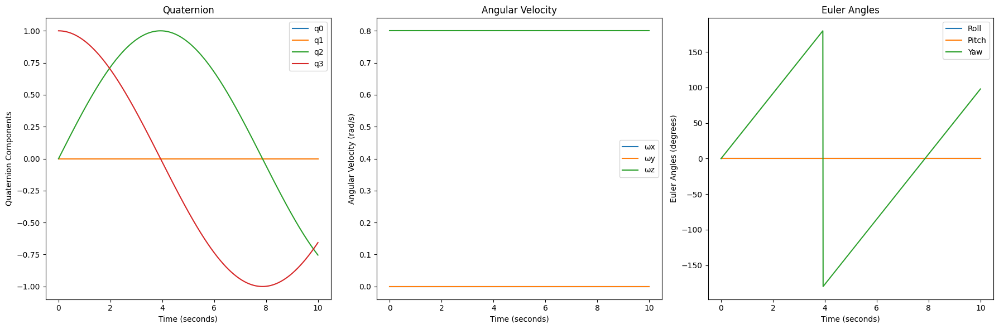

In [4]:
import matplotlib.pyplot as plt
import numpy as np
from scipy.spatial.transform import Rotation as R

# Function to compute the derivative of the quaternion
def quaternion_derivative(quaternion, omega):
    q = quaternion
    q_dot = 0.5 * np.array([
        q[3] * omega[0] + q[1] * omega[2] - q[2] * omega[1],
        q[3] * omega[1] - q[0] * omega[2] + q[2] * omega[0],
        q[3] * omega[2] + q[0] * omega[1] - q[1] * omega[0],
        -q[0] * omega[0] - q[1] * omega[1] - q[2] * omega[2]
    ])
    return q_dot

# Function to solve Euler's equations
def euler_equations(state, I):
    quaternion, omega = state[:4], state[4:]
    omega_dot = np.linalg.inv(I).dot(np.cross(-omega, np.dot(I, omega)))
    q_dot = quaternion_derivative(quaternion, omega)
    return np.concatenate([q_dot, omega_dot])

# Fourth-order Runge-Kutta integration step
def rk4_step(y, t, dt, I):
    k1 = euler_equations(y, I)
    k2 = euler_equations(y + 0.5 * k1 * dt, I)
    k3 = euler_equations(y + 0.5 * k2 * dt, I)
    k4 = euler_equations(y + k3 * dt, I)
    y_new = y + (dt / 6.0) * (k1 + 2*k2 + 2*k3 + k4)
    return y_new

# Initial conditions
I = np.diag([0.2235, 0.1342, 0.1600])  # Moment of inertia (units: kg*m^2)
omega_initial = np.array([0.0, 0.0, 0.8])  # Initial angular velocity (units: rad/s)
quaternion_initial = R.from_euler('xyz', [0, 0, 0]).as_quat()  # Initial attitude (quaternion)

# Initial state vector
initial_state = np.concatenate([quaternion_initial, omega_initial])

# Time parameters
t_start = 0
t_end = 10
dt = 0.01
num_steps = int((t_end - t_start) / dt)
times = np.linspace(t_start, t_end, num_steps)

# Runge-Kutta integration
states = np.zeros((num_steps, len(initial_state)))
states[0] = initial_state
for i in range(1, num_steps):
    states[i] = rk4_step(states[i-1], times[i-1], dt, I)
    # Normalize the quaternion
    states[i, :4] /= np.linalg.norm(states[i, :4])

# Extracting quaternions and angular velocities
quaternions = states[:, :4]
omegas = states[:, 4:]

# Extracting Euler angles in degrees
euler_angles_deg = np.degrees(np.array([R.from_quat(q).as_euler('xyz') for q in quaternions]))

# Plotting the quaternion
plt.figure(figsize=(18, 6))
plt.subplot(1, 3, 1)
plt.plot(times, quaternions)
plt.title("Quaternion")
plt.xlabel("Time (seconds)")
plt.ylabel("Quaternion Components")
plt.legend(['q0', 'q1', 'q2', 'q3'])

# Plotting the angular velocity in degrees per second
plt.subplot(1, 3, 2)
plt.plot(times, omegas)
plt.title("Angular Velocity")
plt.xlabel("Time (seconds)")
plt.ylabel("Angular Velocity (rad/s)")
plt.legend(['ωx', 'ωy', 'ωz'])

# Plotting the Euler angles in degrees
plt.subplot(1, 3, 3)
plt.plot(times, euler_angles_deg)
plt.title("Euler Angles")
plt.xlabel("Time (seconds)")
plt.ylabel("Euler Angles (degrees)")
plt.legend(['Roll', 'Pitch', 'Yaw'])

plt.tight_layout()
plt.show()


Detumbling control by using Quaternion Error

In [ ]:
import numpy as np
from scipy.spatial.transform import Rotation as R
import matplotlib.pyplot as plt

# Function to compute the derivative of the quaternion
def quaternion_derivative(quaternion, omega):
    q = quaternion
    q_dot = 0.5 * np.array([
        q[3] * omega[0] + q[1] * omega[2] - q[2] * omega[1],
        q[3] * omega[1] - q[0] * omega[2] + q[2] * omega[0],
        q[3] * omega[2] + q[0] * omega[1] - q[1] * omega[0],
        -q[0] * omega[0] - q[1] * omega[1] - q[2] * omega[2]
    ])
    return q_dot

# Function to solve Euler's equations with feedback control
def euler_equations_with_feedback(state, I, kd):
    quaternion, omega = state[:4], state[4:]
    # Feedback control to reduce angular velocity
    control_torque = -kd * omega
    omega_dot = np.linalg.inv(I).dot(control_torque + np.cross(-omega, np.dot(I, omega)))
    q_dot = quaternion_derivative(quaternion, omega)
    return np.concatenate([q_dot, omega_dot])

# Fourth-order Runge-Kutta integration step with feedback control
def rk4_step_with_feedback(y, t, dt, I, kd):
    k1 = euler_equations_with_feedback(y, I, kd)
    k2 = euler_equations_with_feedback(y + 0.5 * k1 * dt, I, kd)
    k3 = euler_equations_with_feedback(y + 0.5 * k2 * dt, I, kd)
    k4 = euler_equations_with_feedback(y + k3 * dt, I, kd)
    y_new = y + (dt / 6.0) * (k1 + 2*k2 + 2*k3 + k4)
    return y_new

# Initial conditions
I = np.diag([0.2235, 0.1342, 0.1600])  # Moment of inertia (units: kg*m^2)
omega_initial = np.array([0.0, 0.0, 0.8])  # Initial angular velocity (units: rad/s)
quaternion_initial = R.from_euler('XYZ', [0, 0, 0]).as_quat()  # Initial attitude (quaternion)

# Initial state vector
initial_state = np.concatenate([quaternion_initial, omega_initial])

# Time parameters
t_start = 0
t_end = 10
dt = 0.01
num_steps = int((t_end - t_start) / dt)
times = np.linspace(t_start, t_end, num_steps)

# Control gain for reducing angular velocity
kd = 0.1

# Runge-Kutta integration with feedback control
states = np.zeros((num_steps, len(initial_state)))
states[0] = initial_state
for i in range(1, num_steps):
    states[i] = rk4_step_with_feedback(states[i-1], times[i-1], dt, I, kd)
    states[i, :4] /= np.linalg.norm(states[i, :4])  # Normalize the quaternion

# Extracting quaternions and angular velocities
quaternions = states[:, :4]
omegas = states[:, 4:]

# Extracting Euler angles in degrees
euler_angles_deg = np.degrees(np.array([R.from_quat(q).as_euler('XYZ') for q in quaternions]))

# Plotting the quaternion
plt.figure(figsize=(18, 6))
plt.subplot(1, 3, 1)
plt.plot(times, quaternions)
plt.title("Quaternion")
plt.xlabel("Time (seconds)")
plt.ylabel("Quaternion Components")
plt.legend(['q0', 'q1', 'q2', 'q3'])

# Plotting the angular velocity in degrees per second
plt.subplot(1, 3, 2)
plt.plot(times, omegas)
plt.title("Angular Velocity")
plt.xlabel("Time (seconds)")
plt.ylabel("Angular Velocity (rad/s)")
plt.legend(['ωx', 'ωy', 'ωz'])

# Plotting the Euler angles in degrees
plt.subplot(1, 3, 3)
plt.plot(times, euler_angles_deg)
plt.title("Euler Angles")
plt.xlabel("Time (seconds)")
plt.ylabel("Euler Angles (degrees)")
plt.legend(['Roll', 'Pitch', 'Yaw'])

plt.tight_layout()
plt.show()


Control of satellite angular velocity and attitude

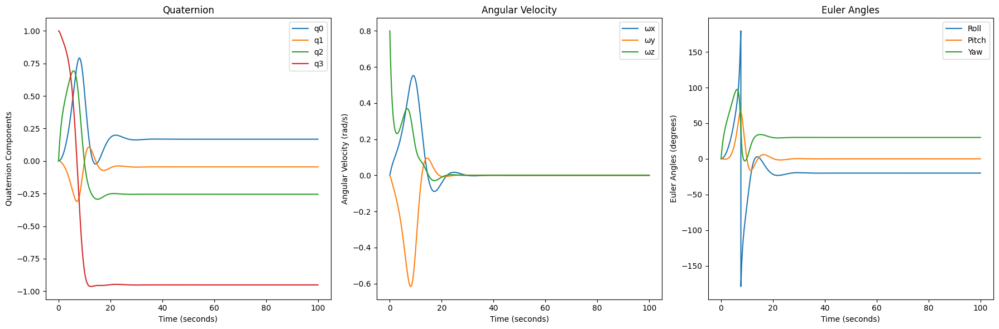

In [6]:
import numpy as np
from scipy.spatial.transform import Rotation as R
import matplotlib.pyplot as plt

# Function to compute the derivative of the quaternion
def quaternion_derivative(quaternion, omega):
    q = quaternion
    q_dot = 0.5 * np.array([
        q[3] * omega[0] + q[1] * omega[2] - q[2] * omega[1],
        q[3] * omega[1] - q[0] * omega[2] + q[2] * omega[0],
        q[3] * omega[2] + q[0] * omega[1] - q[1] * omega[0],
        -q[0] * omega[0] - q[1] * omega[1] - q[2] * omega[2]
    ])
    return q_dot

# Function to compute quaternion error for feedback control
def quaternion_error(target_quaternion, current_quaternion):
    # Convert to Rotation objects
    target_rot = R.from_quat(target_quaternion)
    current_rot = R.from_quat(current_quaternion)
    # Compute the conjugate of the current quaternion
    conj_current = current_rot.inv()
    # Compute the error quaternion (difference between target and current)
    error_rot = conj_current * target_rot
    # Convert back to quaternion
    error_quat = error_rot.as_quat()
    return error_quat

# Function to solve Euler's equations with feedback control
def euler_equations_with_feedback_2(state, I, kd, kp, target_quaternion):
    quaternion, omega = state[:4], state[4:]
    # Quaternion error for attitude control
    error_quat = quaternion_error(target_quaternion, quaternion)
    # Control torque based on quaternion error and angular velocity
    control_torque = -kd * omega - kp * error_quat[:3]
    omega_dot = np.linalg.inv(I).dot(control_torque + np.cross(-omega, np.dot(I, omega)))
    q_dot = quaternion_derivative(quaternion, omega)
    return np.concatenate([q_dot, omega_dot])

# Fourth-order Runge-Kutta integration step with feedback control
def rk4_step_with_feedback(y, t, dt, I, kd, kp, target_quaternion):
    k1 = euler_equations_with_feedback_2(y, I, kd, kp, target_quaternion)
    k2 = euler_equations_with_feedback_2(y + 0.5 * k1 * dt, I, kd, kp, target_quaternion)
    k3 = euler_equations_with_feedback_2(y + 0.5 * k2 * dt, I, kd, kp, target_quaternion)
    k4 = euler_equations_with_feedback_2(y + k3 * dt, I, kd, kp, target_quaternion)
    y_new = y + (dt / 6.0) * (k1 + 2*k2 + 2*k3 + k4)
    return y_new

# Initial conditions
I = np.diag([0.2235, 0.1342, 0.1600])  # Moment of inertia (units: kg*m^2)
omega_initial = np.array([0.0, 0.0, 0.8])  # Initial angular velocity (units: rad/s)
quaternion_initial = R.from_euler('XYZ', [0, 0, 0]).as_quat()  # Initial attitude (quaternion)

# Initial state vector
initial_state = np.concatenate([quaternion_initial, omega_initial])

# Time parameters
t_start = 0
t_end = 100
dt = 0.01
num_steps = int((t_end - t_start) / dt)
times = np.linspace(t_start, t_end, num_steps)

# Target Euler angles and corresponding quaternion
target_euler = np.radians([-20, 0, 30])  # Convert to radians
target_quaternion = R.from_euler('XYZ', target_euler).as_quat()

# Control gains
kd = 0.1  # Damping gain for angular velocity control
kp = 0.1  # Proportional gain for quaternion error control

# Runge-Kutta integration with feedback control
states = np.zeros((num_steps, len(initial_state)))
states[0] = initial_state
for i in range(1, num_steps):
    states[i] = rk4_step_with_feedback(states[i-1], times[i-1], dt, I, kd, kp, target_quaternion)
    states[i, :4] /= np.linalg.norm(states[i, :4])  # Normalize the quaternion

# Extracting quaternions and angular velocities
quaternions = states[:, :4]
omegas = states[:, 4:]

# Extracting Euler angles in degrees
euler_angles_deg = np.degrees(np.array([R.from_quat(q).as_euler('XYZ') for q in quaternions]))

# Plotting the quaternion
plt.figure(figsize=(18, 6))
plt.subplot(1, 3, 1)
plt.plot(times, quaternions)
plt.title("Quaternion")
plt.xlabel("Time (seconds)")
plt.ylabel("Quaternion Components")
plt.legend(['q0', 'q1', 'q2', 'q3'])

# Plotting the angular velocity in degrees per second
plt.subplot(1, 3, 2)
plt.plot(times, omegas)
plt.title("Angular Velocity")
plt.xlabel("Time (seconds)")
plt.ylabel("Angular Velocity (rad/s)")
plt.legend(['ωx', 'ωy', 'ωz'])

# Plotting the Euler angles in degrees
plt.subplot(1, 3, 3)
plt.plot(times, euler_angles_deg)
plt.title("Euler Angles")
plt.xlabel("Time (seconds)")
plt.ylabel("Euler Angles (degrees)")
plt.legend(['Roll', 'Pitch', 'Yaw'])

plt.tight_layout()
plt.show()
